In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.io import imread, imsave
from matplotlib import gridspec

In [2]:
data_path = '/home/kirill/habitat-lab/exploration_ros_free/top_down_maps'

In [3]:
def find_file(path, episode_id):
    for f in os.listdir(path):
        if f.startswith('episode_{}'.format(episode_id)):
            return os.path.join(path, f)
    return None

eval_episodes = [3, 4, 5, 7, 99, 100, 101, 102, 103, 104, 106, 107, 198, 199, 200, 202, 203, 204, 205, 206, 297, 299, 300, 301, 303, 304, 305, 396, 397, 398, 399, 401, 402, 403, 495, 496, 497, 498, 499, 501, 503, 594, 595, 596, 597, 598, 599, 600, 602, 693, 694, 696, 697, 698, 700, 701, 792, 793, 794, 795, 797, 798, 799, 800, 891, 894, 895, 896, 899, 990, 991, 992, 994, 996, 997, 998, 1089, 1093, 1094, 1095, 1096, 1097, 1188, 1189, 1191, 1192, 1193, 1194, 1195, 1196, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1386, 1387, 1390, 1391, 1392, 1393, 1394, 1485, 1486, 1487, 1489, 1493, 1584, 1585, 1587, 1588, 1589, 1590, 1591, 1592, 1684, 1685, 1686, 1687, 1688, 1690, 1691, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1881, 1885, 1886, 1888, 1889]
topdownmap_filenames = []
top_down_maps = []
critic_scores = []
fbe_costs = []
trajectories = []
for i in eval_episodes:
    f = find_file(data_path, i)
    if f is not None:
        top_down_maps.append(imread(f))
        topdownmap_filenames.append(f.split('/')[-1])
    f = find_file(os.path.join(data_path, 'cost_values'), i)
    if f is not None:
        fbe_costs.append(np.loadtxt(f))
    f = find_file(os.path.join(data_path, 'critic_values'), i)
    if f is not None:
        critic_scores.append(np.loadtxt(f))
    f = find_file(os.path.join(data_path, 'trajectories'), i)
    if f is not None:
        trajectories.append(np.loadtxt(f))
assert(len(fbe_costs) == len(top_down_maps) == len(critic_scores) == len(trajectories))
for i in range(len(top_down_maps)):
    if len(fbe_costs[i].shape) == 0:
        fbe_costs[i] = np.array([fbe_costs[i]])
    if len(critic_scores[i].shape) == 0:
        critic_scores[i] = np.array([critic_scores[i]])
    if len(trajectories[i].shape) == 0:
        trajectories[i] = np.array([trajectories[i]])

In [4]:
def rotate(x, y, theta):
    x_new = x * np.cos(theta) + y * np.sin(theta)
    y_new = -x * np.sin(theta) + y * np.cos(theta)
    return x_new, y_new

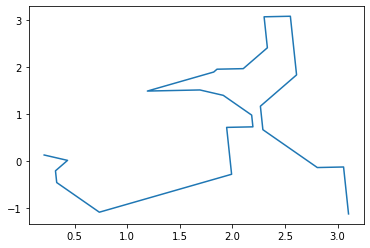

In [5]:
x_rotated, y_rotated = rotate(-trajectories[0][:, 1], trajectories[0][:, 0], 1)
plt.plot(x_rotated, y_rotated)
#plt.scatter(-trajectories[0][:, 1], -trajectories[0][:, 0], alpha=0.1)

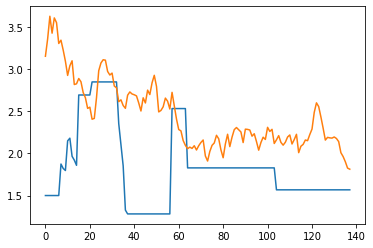

In [6]:
plt.plot((15 - fbe_costs[0]) / 10)
plt.plot(critic_scores[0])

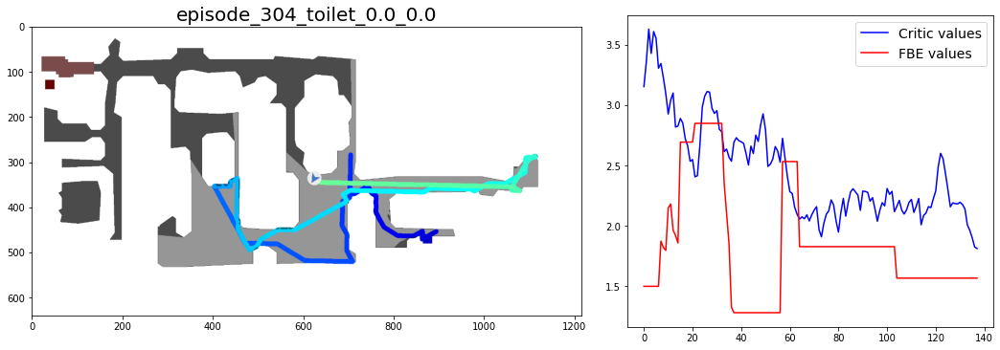

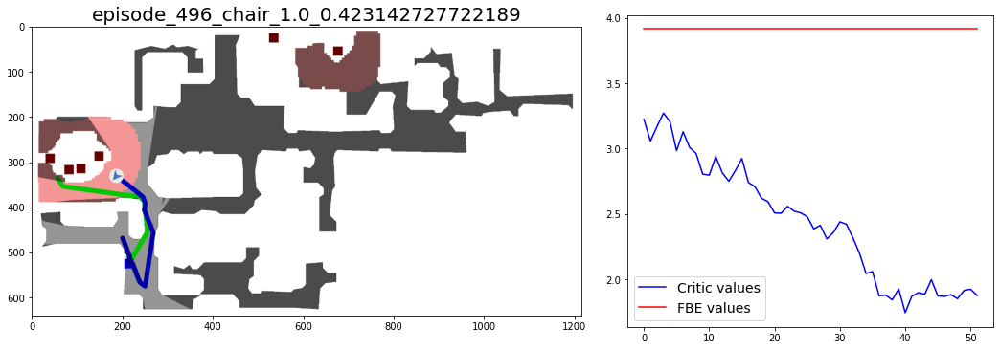

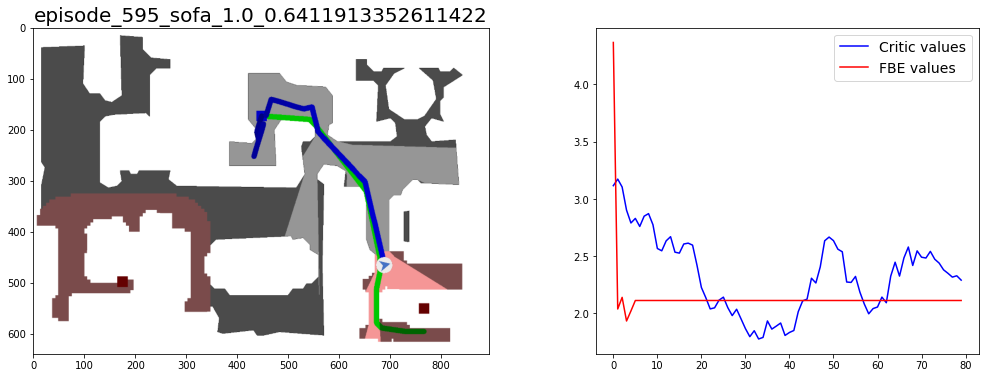

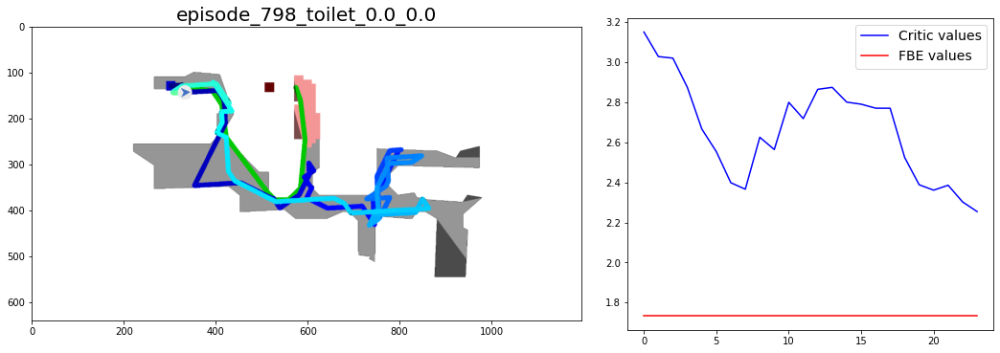

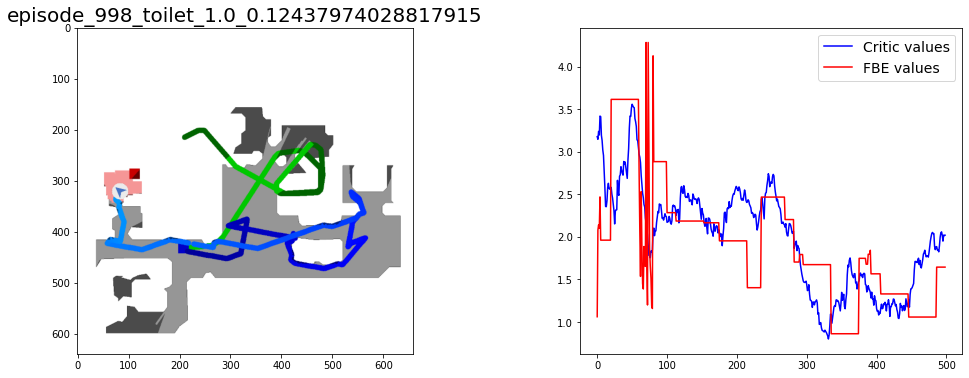

...

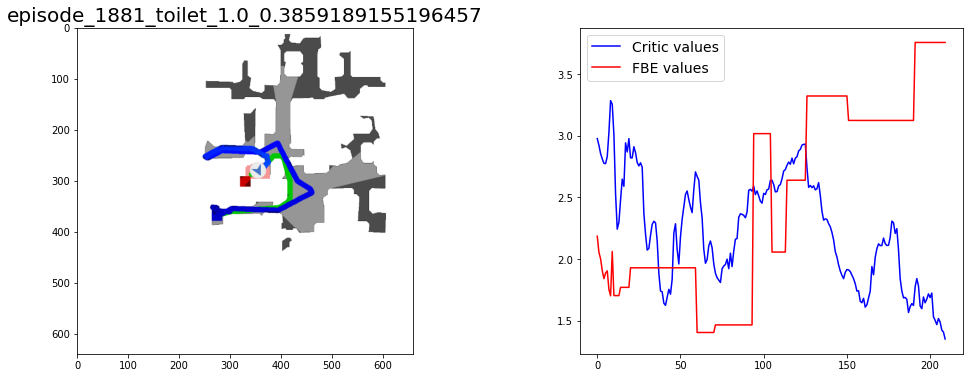

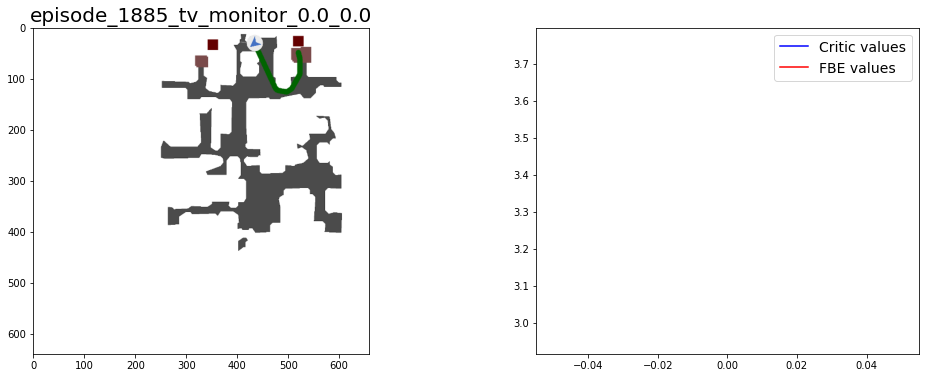

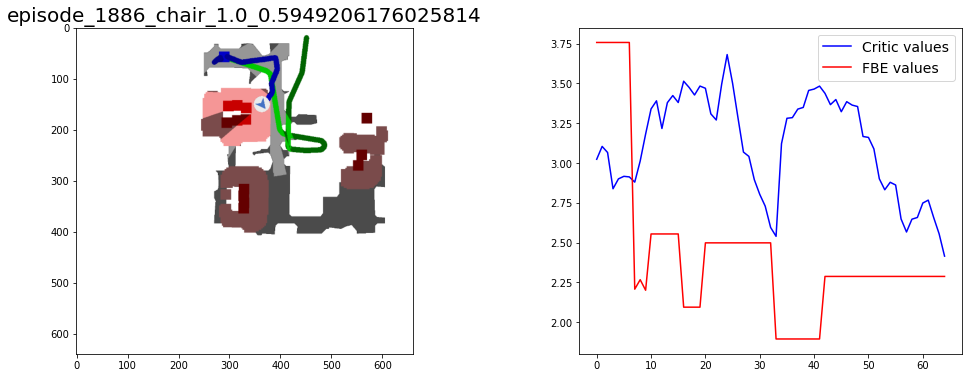

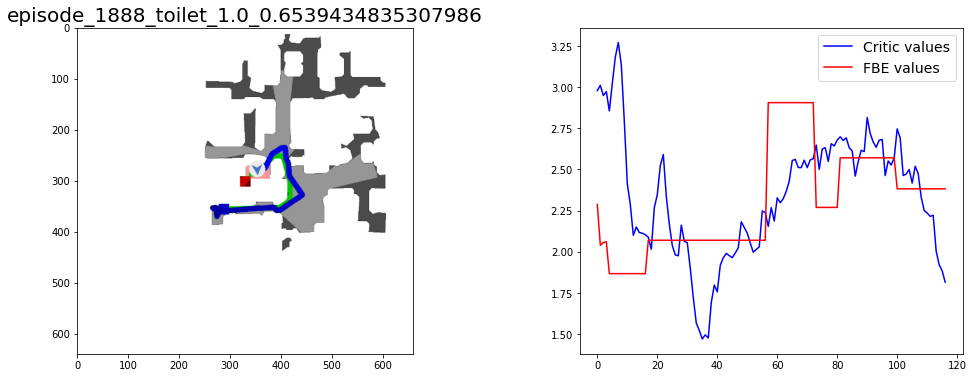

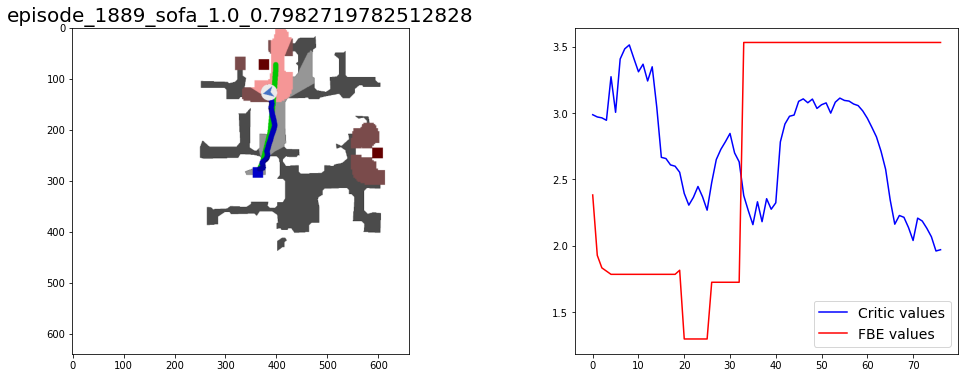

In [7]:
for i in range(len(top_down_maps)):
    fig = plt.figure(figsize=(18, 6))
    spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1.5, 1], wspace=0.1, height_ratios=[1])
    ax0 = fig.add_subplot(spec[0])
    ax0.set_title(topdownmap_filenames[i][:-4], fontsize=20)
    ax0.imshow(top_down_maps[i])
    ax1 = fig.add_subplot(spec[1])
    ax1.plot(critic_scores[i], color='b', label='Critic values')
    ax1.plot((15 - fbe_costs[i]) / 10, color='r', label='FBE values')
    ax1.legend(fontsize=14)
    plt.savefig(os.path.join('top_down_maps_and_scores', topdownmap_filenames[i]))
    plt.show()